# 🧠 MRI Tumor Detection with Deep Learning

## 🧾 Project Overview
This project aims to develop a Convolutional Neural Network (CNN)-based model to automatically detect brain tumors from MRI images. The growing volume of MRI scans and the scarcity of trained radiologists necessitate an automated, accurate system to assist in early diagnosis and clinical decision-making.

By leveraging deep learning, particularly Convolutional Neural Networks (CNNs), we attempt to classify MRI images into two primary categories:
- **Tumor**
- **No Tumor**

The model is trained on a labeled dataset of brain MRI images and evaluated for performance using key metrics such as accuracy, precision, recall, and F1-score.

## 🌍 Our Purpose & Mission

The global healthcare system suffers from a *shortage of radiologists*, particularly in developing regions. Many patients wait days or weeks for basic diagnostic results. During that time, a tumor can grow, a life can change — or end.

Our mission is to:

- Democratize AI tools in medical diagnostics.
- Create *free and open-source* deep learning models that any medical institution or researcher can use.
- Allow doctors in under-resourced areas to access *AI-based second opinions* with no cost.

This model is designed not as a replacement for radiologists, but as an *assistant* to reduce their workload, improve consistency, and help catch tumors early — when they are most treatable.

## Key Objectives

Our primary task is to develop a robust deep learning model capable of efficiently detecting and localizing brain tumors in MRI scans. To achieve this, we have been provided with a dataset consisting of 3929 brain MRI scans, each annotated with the location of the tumor. The proposed solution involves the implementation of a layered deep learning pipeline, incorporating both classification and segmentation techniques.

## Architecture Overview

The architecture we'll be leveraging comprises two essential components:
- **ResNet Deep Learning Classifier Model:** This component is designed to classify MRI scans as either having or not having a brain tumor. Residual Neural Networks (ResNets) are employed to overcome challenges associated with vanishing gradients, ensuring effective training even with deep architectures.
- **ResUNet Segmentation Model:** The segmentation model, based on the ResUNet architecture, enables pixel-level localization of tumors. This involves understanding and extracting information from images at the pixel level, providing detailed masks that pinpoint tumor locations.

## Transfer Learning

To expedite the training process and capitalize on existing knowledge, we will be employing transfer learning. This technique involves repurposing a pre-trained model, specifically ResNet, for our brain tumor detection task. Transfer learning offers advantages such as faster training progress and the ability to achieve remarkable results with a relatively small training dataset.

## Getting Started

Before diving into the implementation, ensure you have the necessary dependencies installed. Additionally, familiarize yourself with the provided dataset and the project's structure. The full list of startups and resources mentioned in this document can be referred to for further insights.

Let's embark on this journey to leverage AI and cutting-edge technologies to contribute to the early diagnosis and effective management of brain tumors. Together, with AI and bright minds, we aim to eliminate diseases and make a lasting impact on healthcare.


# Dependencies

To kick off our MRI Tumor Detection project, let's ensure we have all the necessary libraries and frameworks installed. Below are the key dependencies we'll be utilizing for data manipulation, visualization, and deep learning implementation:


Ensure that you have the required packages installed to seamlessly execute the subsequent code cells. If any libraries are missing, you can install them using `!pip install <package_name>` in a code cell within your Jupyter Notebook or Google Colab environment.


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
import tensorflow as tf
from skimage import io
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

Loading the dataset into brain_df variable

In [3]:
# data containing path to Brain MRI and their corresponding mask
# data was obtained from the open-source, but you might download it from my Github repository.
import pandas as pd


brain_df = pd.read_csv('data_mask.csv')
brain_df.head()


,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [4]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


The code brain_df['mask'].value_counts().index is used to retrieve the unique values of the 'mask' column in the DataFrame brain_df, along with their respective counts. This is valuable for understanding the distribution of different categories or classes within the 'mask' column.

In [5]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

Use plotly to plot interactive bar chart


In [11]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as pl

fig = pl.Figure([pl.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 9, opacity = 0.9)
fig.show()

In [12]:
brain_df.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [27]:
import os

file_path = brain_df.mask_path[577]
print("Exists?", os.path.exists(file_path))

Exists? True


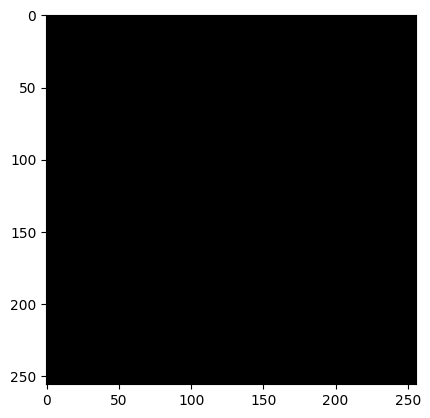

In [26]:
import matplotlib.pyplot as mplt
import cv2

img = cv2.imread(brain_df.mask_path[577])
if img is not None:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mplt.imshow(img_rgb)
else:
    print("Image not found:", brain_df.mask_path[623])

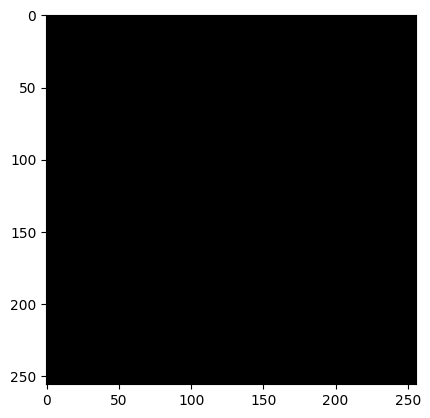

In [23]:
import matplotlib.pyplot as mplt
import cv2
mplt.imshow(cv2.imread(brain_df.mask_path[577]))
# brain_df.mask_path[577]

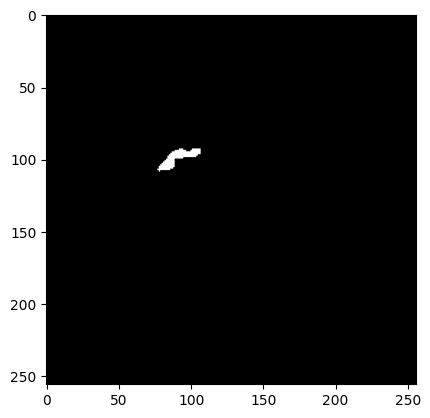

In [31]:
import matplotlib.pyplot as mplt
import cv2
mplt.imshow(cv2.imread(brain_df.mask_path[623]))
# brain_df.mask_path[623]

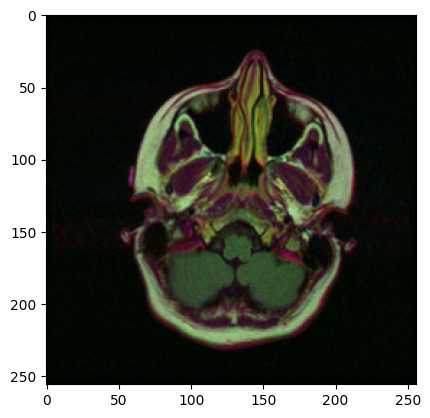

In [32]:
import matplotlib.pyplot as mplt
import cv2
mplt.imshow(cv2.imread(brain_df.image_path[577]))

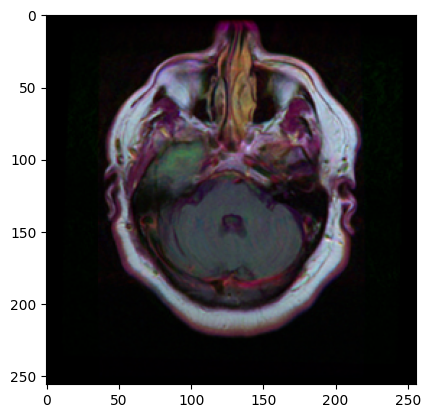

In [33]:
import matplotlib.pyplot as mplt
import cv2
mplt.imshow(cv2.imread(brain_df.image_path[623]))

In [ ]:
cv2.imread(brain_df.mask_path[577]).max()
#representing the color of the specific mask_path.
#mask_path[577] max() is black

0

In [ ]:
cv2.imread(brain_df.mask_path[623]).max()
#mask_path[623] max() is white

255

In [ ]:
cv2.imread(brain_df.mask_path[577]).min()
#representing the color of the specific mask_path.
#mash_path[577] min() is black

0

In [ ]:
cv2.imread(brain_df.mask_path[623]).min()
#mask_path[623] min() is black

0

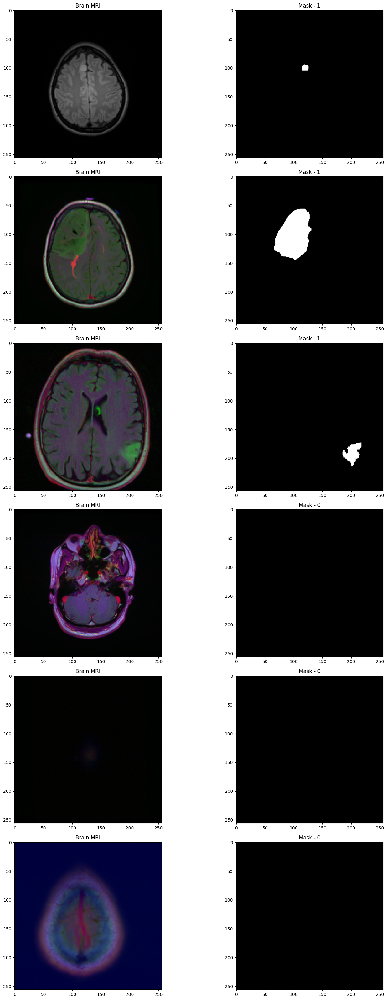

In [39]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately 
import random
fig, axs = mplt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI 
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

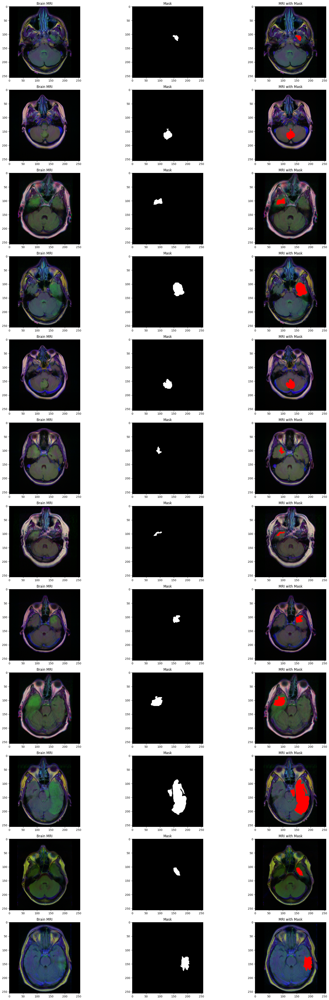

In [ ]:
#Blending the MRI and Mask images together.
from skimage import io
count = 0
fig, axs = mplt.subplots(12, 3, figsize = (20, 50)) # 12 rows and 3 columns
for i in range(len(brain_df)):
  if brain_df['mask'][i] ==1 and count <12: # Setting the condition to plot only images with mask 1 ( with tumors ) and count of less than 12.
    
    img = io.imread(brain_df.image_path[i]) # Read the MRI image.
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].imshow(img)


    mask = io.imread(brain_df.mask_path[i]) # Read the corresponding mask.
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')

    
    img[mask == 255] = (255, 0, 0) # Blend the mask with the MRI image. Defining the color of the mask as red.
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()


In [43]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [ ]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe

brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [45]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.20)

In [ ]:
# create a image generator
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1; thereby normalizes the training,  and makes validation split of 0.20
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.20)


In [48]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))




Found 2515 validated image filenames belonging to 2 classes.
Found 628 validated image filenames belonging to 2 classes.
Found 786 validated image filenames belonging to 2 classes.


In [52]:
# Get the ResNet50 base model
from tensorflow.keras.layers import Input
from tensorflow.keras.applications import ResNet50
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [51]:
basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [54]:
# freeze the model weights
from tensorflow.keras import layers

for layer in basemodel.layers:
  layers.trainable = False

In [59]:
# Add classification head to the base model
from tensorflow.keras.layers import AveragePooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Model
headmodel = basemodel.output # Defining the headmodel as a basemodel output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel) # Pooling the output size to be 4 by 4
headmodel = Flatten(name= 'flatten')(headmodel) # Flatten the output to 1D array
headmodel = Dense(256, activation = "relu")(headmodel) # Adding a fully coonected dense 256 layer
headmodel = Dropout(0.3)(headmodel) #Reducing overfitting by adding dropout layer
# Iterating the process.
headmodel = Dense(256, activation = "relu")(headmodel) 
headmodel = Dropout(0.3)(headmodel)

headmodel = Dense(2, activation = 'softmax')(headmodel) # Adding a final dens layer with the two neurons

model = Model(inputs = basemodel.input, outputs = headmodel) # Inputing the basemodel and outputting our headmodel that is initial model that we processed through layers.

In [62]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [63]:
# Compile the model with loss function, optimizer, and metrics
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [66]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
from tensorflow.keras.callbacks import EarlyStopping
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with least validation loss
from tensorflow.keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.hdf5", verbose=1, save_best_only=True)

In [67]:
# It now trains our model for one epoch using data that we defined as data for training, determining how many batches to tun per epoch, validating the model, and applying checkpointer and earlystopping to save the best model and stop if eraly validation doesn't improve. 

history = model.fit(train_generator, steps_per_epoch= train_generator.n // 16, epochs = 1, validation_data= valid_generator, validation_steps= valid_generator.n // 16, callbacks=[checkpointer, earlystopping])



157/157 [==============================] - ETA: 0s - loss: 0.9155 - accuracy: 0.7095
Epoch 1: val_loss improved from inf to 1.03388, saving model to classifier-resnet-weights.hdf5


c:\Users\user\Documents\CNN for brain tumors detection\.venv\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



157/157 [==============================] - 654s 4s/step - loss: 0.9155 - accuracy: 0.7095 - val_loss: 1.0339 - val_accuracy: 0.6410


In [68]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json)

In [70]:
# Load pretrained model (instead of training the model for 1+ hours) 
with open('resnet-50-MRI.json', 'r') as json_file:
    json_savedModel= json_file.read()

# load the model  
import tensorflow as tf
model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights('weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [ ]:
# Testing pretrained model
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

49/49 [==============================] - 58s 1s/step


In [ ]:

test_predict
# Model's predicted probabilities for each class (0 and 1) for the test images.

array([[7.4595795e-04, 9.9925405e-01],
       [2.5839566e-07, 9.9999976e-01],
       [9.9999595e-01, 4.0143136e-06],
       ...,
       [3.1354547e-02, 9.6864545e-01],
       [1.3907426e-03, 9.9860919e-01],
       [9.9999642e-01, 3.5651087e-06]], dtype=float32)

In [ ]:
# Convert the predicted probabilities to class lables
predict = []
import numpy as np
for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [75]:
predict

array(['1', '1', '0', '0', '0', '0', '1', '1', '0', '0', '0', '1', '1',
       '0', '0', '1', '0', '0', '0', '0', '1', '0', '1', '1', '0', '0',
       '0', '1', '1', '1', '0', '0', '0', '0', '1', '1', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '1', '0', '1', '0', '0', '1', '1',
       '1', '1', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '1', '0', '1', '0', '1', '1', '0', '0', '1', '0',
       '1', '0', '1', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0',
       '1', '0', '0', '0', '1', '0', '1', '0', '0', '0', '0', '0', '1',
       '0', '1', '0', '0', '1', '0', '1', '0', '0', '0', '0', '1', '1',
       '0', '0', '1', '0', '1', '0', '1', '0', '0', '0', '0', '1', '1',
       '0', '0', '1', '0', '0', '1', '0', '0', '0', '1', '1', '0', '0',
       '1', '1', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '1',
       '0', '1', '1', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0',
       '0', '1', '1', '0', '0', '1', '1', '0', '0', '1', '1', '1

In [ ]:
# Define original predictions from the test set.
original = np.asarray(test['mask'])[:len(predict)]
len(original)

784

In [ ]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict) 
accuracy

0.9795918367346939

<Axes: >

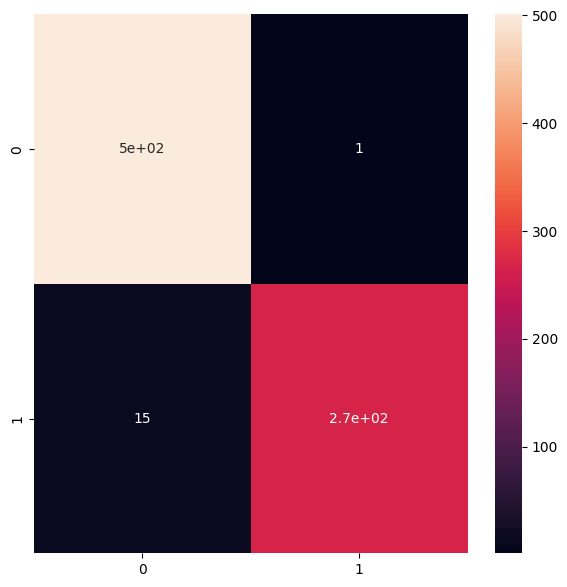

In [ ]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

#The top left cell is the number of true negatives (correctly predicted as 0), the bottom right cell is the number of true positives (correctly predicted as 1), the top right cell is the number of false positives (inccorrectly predicted as 1), and the bottom left cell is the nnumber of false negatives (incorrectly predicted as 0).

In [81]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       502
           1       1.00      0.95      0.97       282

   micro avg       0.98      0.98      0.98       784
   macro avg       0.98      0.97      0.98       784
weighted avg       0.98      0.98      0.98       784



In [83]:
# Get the dataframe containing MRIs which have masks associated with them (MRI with tumor).
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape
brain_df_mask.head()

,patient_id,image_path,mask_path,mask
445,TCGA_DU_5872_19950223,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_5.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_5_...,1
507,TCGA_DU_5874_19950510,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_5.tif,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_5_...,1
551,TCGA_DU_5854_19951104,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_6.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_6_...,1
555,TCGA_DU_5854_19951104,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_6.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_6_...,1
617,TCGA_DU_5853_19950823,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_6.tif,TCGA_HT_7680_19970202/TCGA_HT_7680_19970202_6_...,1


In [84]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.20)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [ ]:
#Prepare the train and validation data for training
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [86]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import DataGenerator

# create image generators

training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [ ]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add
# Define resblock with layers
def resblock(X, f):
  

  # make a copy of input
  X_copy = X

  # Layers
  # F(X)
  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X) 

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Layers
  # X

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together, thereby executing the skip connection (Identity layer)
  # F(X) + X
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [ ]:
# function to upscale and concatenate the values passed
from tensorflow.keras.layers import UpSampling2D, Concatenate
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [90]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)
from tensorflow.keras.layers import MaxPool2D
# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [91]:
model_seg.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['batch_normalization[0]

In [92]:
# from utilities import focal_tversky, tversky_loss, tversky
from utilities import focal_tversky, tversky_loss,tversky

In [93]:
# Compile the model
legacy_adam = tf.keras.optimizers.legacy.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = legacy_adam, loss = focal_tversky, metrics = [tversky])

In [94]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.hdf5", verbose=1, save_best_only=True)

In [95]:
history = model_seg.fit(training_generator, epochs = 1, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

68/68 [==============================] - ETA: 0s - loss: 0.8925 - tversky: 0.1405
Epoch 1: val_loss improved from inf to 0.85576, saving model to ResUNet-weights.hdf5


c:\Users\user\Documents\CNN for brain tumors detection\.venv\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



68/68 [==============================] - 157s 2s/step - loss: 0.8925 - tversky: 0.1405 - val_loss: 0.8558 - val_tversky: 0.1874


In [96]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("ResUNet-model.json","w") as json_file:
  json_file.write(model_json)

In [97]:
from utilities import focal_tversky, tversky_loss, tversky

with open('ResUNet-MRI.json', 'r') as json_file:
    json_savedModel= json_file.read()

# load the model architecture 
model_seg = tf.keras.models.model_from_json(json_savedModel)
model_seg.load_weights('weights_seg.hdf5')
legacy_adam = tf.keras.optimizers.legacy.Adam(learning_rate=0.05, epsilon=0.1)
model_seg.compile(optimizer = legacy_adam, loss = focal_tversky, metrics = [tversky])

In [98]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 64ms/step


In [99]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_FG_6692_20020606/TCGA_FG_6692_20020606_15...,"[[[[1.0192057e-06], [5.896497e-06], [9.885918e...",1
1,TCGA_DU_8166_19970322/TCGA_DU_8166_19970322_29...,"[[[[3.8595385e-07], [1.4234791e-06], [2.980668...",1
2,TCGA_DU_8166_19970322/TCGA_DU_8166_19970322_1.tif,No mask,0
3,TCGA_DU_5855_19951217/TCGA_DU_5855_19951217_8.tif,No mask,0
4,TCGA_DU_A5TY_19970709/TCGA_DU_A5TY_19970709_36...,No mask,0
...,...,...,...
781,TCGA_DU_A5TP_19970614/TCGA_DU_A5TP_19970614_31...,"[[[[4.0338293e-07], [1.5235827e-06], [3.204692...",1
782,TCGA_DU_5854_19951104/TCGA_DU_5854_19951104_21...,"[[[[8.0213744e-07], [3.0010137e-06], [6.410247...",1
783,TCGA_DU_8164_19970111/TCGA_DU_8164_19970111_14...,No mask,0
784,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_38...,"[[[[7.102778e-07], [2.633313e-06], [4.3970354e...",1


In [101]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_FG_6692_20020606/TCGA_FG_6692_20020606_15...,TCGA_FG_6692_20020606/TCGA_FG_6692_20020606_15...,1,"[[[[1.0192057e-06], [5.896497e-06], [9.885918e...",1
1,TCGA_DU_8166_19970322/TCGA_DU_8166_19970322_29...,TCGA_DU_8166_19970322/TCGA_DU_8166_19970322_29...,1,"[[[[3.8595385e-07], [1.4234791e-06], [2.980668...",1
2,TCGA_DU_8166_19970322/TCGA_DU_8166_19970322_1.tif,TCGA_DU_8166_19970322/TCGA_DU_8166_19970322_1_...,0,No mask,0
3,TCGA_DU_5855_19951217/TCGA_DU_5855_19951217_8.tif,TCGA_DU_5855_19951217/TCGA_DU_5855_19951217_8_...,0,No mask,0
4,TCGA_DU_A5TY_19970709/TCGA_DU_A5TY_19970709_36...,TCGA_DU_A5TY_19970709/TCGA_DU_A5TY_19970709_36...,0,No mask,0


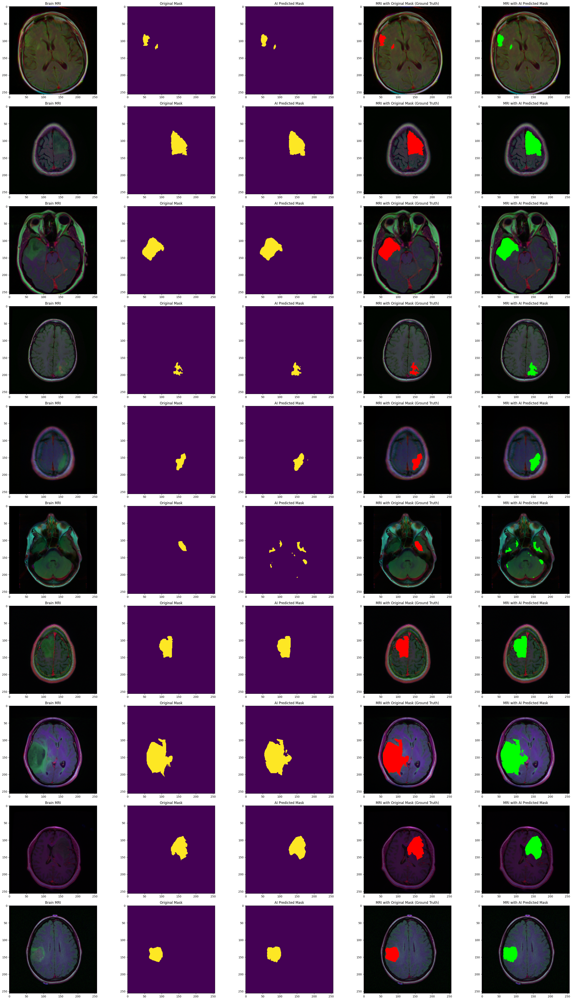

In [102]:
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()

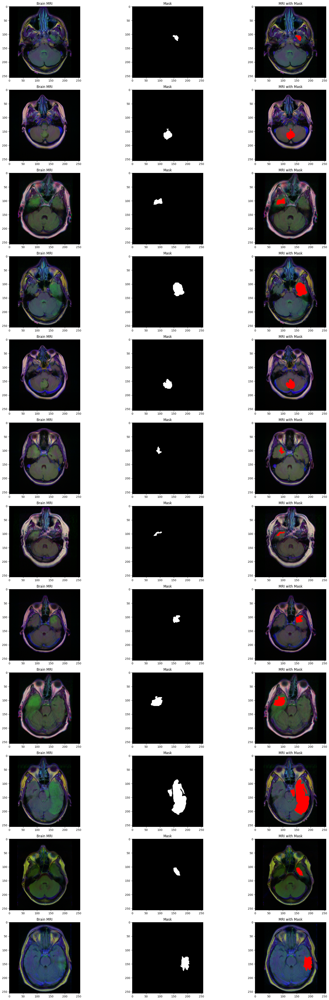

In [103]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image 
count = 0 
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
  # read the images 
    img = io.imread(brain_df.image_path[i])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # obtain the mask for the image 
    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')
    
    # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255 
    img[mask == 255] = (255,0,0)    
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()